### HW01

In [2]:
import os
import sys
import importlib
from pathlib import Path

import pandas as pd
import geopandas as gpd

import numpy as np



import matplotlib.pyplot as plt 
import contextily as cx

In [3]:
import folium

In [4]:
print(gpd.options.io_engine)

None


In [5]:
from pyogrio import list_layers

#### Definição da diretoria de trabalho na directoria raiz do projeto

In [6]:
from pathlib import Path

# Find the project root (assuming marker-based or script-relative path)
def find_project_root(marker="README.md"):
    current_dir = Path.cwd()
    while current_dir != current_dir.parent:  # Traverse up until root
        if (current_dir / marker).exists():
            return current_dir
        current_dir = current_dir.parent
    raise FileNotFoundError(f"Marker '{marker}' not found in any parent directory.")

project_root = find_project_root()
sys.path.append(str(project_root)) 

# Or use a relative path: project_root = Path(__file__).resolve().parent.parent
os.chdir(project_root)
print(f"Working directory set to: {project_root}")

Working directory set to: C:\Users\wpego\anaconda3\projETE2425-main


#### ADD our own library to the libraries paths

In [7]:
module_path = os.path.abspath(os.path.join(r'.\src'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [8]:
module_path

'C:\\Users\\wpego\\anaconda3\\projETE2425-main\\src'

In [9]:
import utils.utils_ete2425

## Ler dados de base

### Dados administrativos nacionais 
BGRI: https://mapas.ine.pt/download/index2021 

CONTINENTE [BGRI21_CONT.gpkg](https://mapas.ine.pt/download/filesGPG/2021/BGRI21_CONT.zip)

REGIAO DE AVEIRO [BGRI21_16D.gpkg](https://mapas.ine.pt/download/filesGPG/2021/nuts3/BGRI21_16D.zip)

caop: https://www.dgterritorio.gov.pt/cartografia/cartografia-tematica/caop


NUTS3: 191 região de aveiro. 

link: https://www.dgterritorio.gov.pt/sites/default/files/ficheiros-cartografia/Areas_Freg_Mun_Dist_Pais_CAOP2024.zip


In [10]:
print('layers CONT')
print(list_layers(r'.\data\input' + r'\HW01\BGRI21_CONT.gpkg'))
print('layers REGIA DE AVEIRO')
print(list_layers(r'.\data\input' + r'\HW01\BGRI21_16D.gpkg'))

layers CONT
[['BGRI21_CONT' 'MultiPolygon']]
layers REGIA DE AVEIRO
[['BGRI21_16D' 'MultiPolygon']]


In [57]:
shape_CONT = gpd.read_file(r'.\data\input' + r'\HW01\BGRI21_CONT.gpkg', layer = 'BGRI21_CONT' )
shape_REGIAO_AVEIRO = gpd.read_file(r'.\data\input' + r'\HW01\BGRI21_16D.gpkg', layer = 'BGRI21_16D' )

<Axes: >

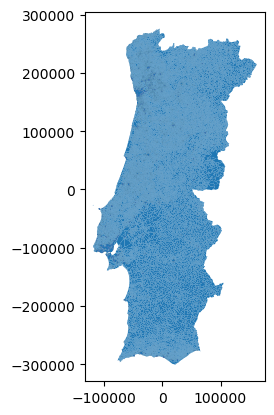

In [58]:
shape_CONT.plot()

In [59]:
shape_CONT.crs

<Projected CRS: EPSG:3763>
Name: ETRS89 / Portugal TM06
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Portugal - mainland - onshore.
- bounds: (-9.56, 36.95, -6.19, 42.16)
Coordinate Operation:
- name: Portugual TM06
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<Axes: >

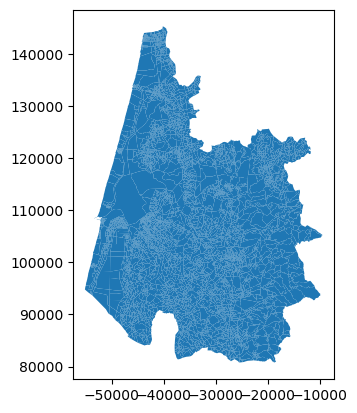

In [60]:
shape_REG_AVEIRO.plot()

In [61]:
shape_CONT_WGS84 = shape_CONT.to_crs(epsg=4326)

<Axes: >

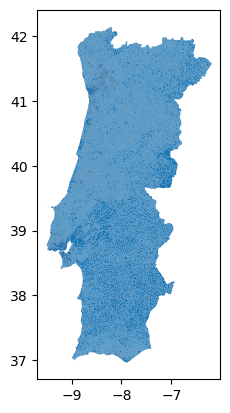

In [62]:
shape_CONT_WGS84.plot()

In [63]:
shape_CONT_WGS84.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [64]:
shape_CONT_WGS84.head(2)

,OBJECTID,BGRI2021,DT21,DTMN21,DTMNFR21,DTMNFRSEC21,SECNUM21,SSNUM21,SECSSNUM21,SUBSECCAO,...,N_INDIVIDUOS,N_INDIVIDUOS_H,N_INDIVIDUOS_M,N_INDIVIDUOS_0_14,N_INDIVIDUOS_15_24,N_INDIVIDUOS_25_64,N_INDIVIDUOS_65_OU_MAIS,Shape_Length,Shape_Area,geometry
0,1,16101700125,16,1610,161017,161017001,001,25,00125,16101700125,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2233.574667,154871.677487,"MULTIPOLYGON (((-8.69914 41.93909, -8.6987 41...."
1,2,16101900118,16,1610,161019,161019001,001,18,00118,16101900118,...,6.0,4.0,2.0,2.0,0.0,3.0,1.0,1475.979773,69077.135501,"MULTIPOLYGON (((-8.73296 41.94113, -8.73293 41..."


In [65]:
shape_REG_AVEIRO_WGS84 = shape_REGIAO_AVEIRO.to_crs(epsg=4326)

<Axes: >

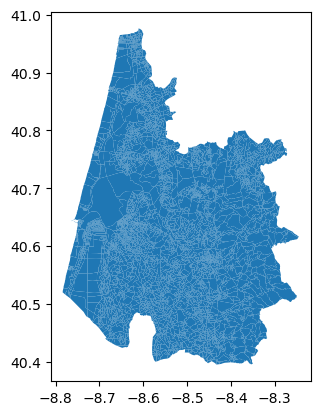

In [21]:
shape_REG_AVEIRO_WGS84.plot()

In [22]:
shape_REG_AVEIRO_WGS84.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [23]:
shape_REG_AVEIRO_WGS84.head(2)

,OBJECTID,BGRI2021,DT21,DTMN21,DTMNFR21,DTMNFRSEC21,SECNUM21,SSNUM21,SECSSNUM21,SUBSECCAO,...,N_INDIVIDUOS,N_INDIVIDUOS_H,N_INDIVIDUOS_M,N_INDIVIDUOS_0_14,N_INDIVIDUOS_15_24,N_INDIVIDUOS_25_64,N_INDIVIDUOS_65_OU_MAIS,SHAPE_Length,SHAPE_Area,geometry
0,70393,01011900106,01,0101,010119,010119001,001,06,00106,01011900106,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9835.958931,3.791972e+06,"MULTIPOLYGON (((-8.39702 40.60952, -8.39683 40..."
1,70394,01012600312,01,0101,010126,010126003,003,12,00312,01012600312,...,23.0,11.0,12.0,2.0,0.0,13.0,8.0,662.042845,2.215863e+04,"MULTIPOLYGON (((-8.48496 40.60919, -8.4849 40...."


In [24]:
shape_REG_AVEIRO_WGS84.columns

Index(['OBJECTID', 'BGRI2021', 'DT21', 'DTMN21', 'DTMNFR21', 'DTMNFRSEC21',
       'SECNUM21', 'SSNUM21', 'SECSSNUM21', 'SUBSECCAO', 'NUTS1', 'NUTS2',
       'NUTS3', 'N_EDIFICIOS_CLASSICOS', 'N_EDIFICIOS_CLASS_CONST_1_OU_2_ALOJ',
       'N_EDIFICIOS_CLASS_CONST_3_OU_MAIS_ALOJAMENTOS',
       'N_EDIFICIOS_EXCLUSIV_RESID', 'N_EDIFICIOS_1_OU_2_PISOS',
       'N_EDIFICIOS_3_OU_MAIS_PISOS', 'N_EDIFICIOS_CONSTR_ANTES_1945',
       'N_EDIFICIOS_CONSTR_1946_1980', 'N_EDIFICIOS_CONSTR_1981_2000',
       'N_EDIFICIOS_CONSTR_2001_2010', 'N_EDIFICIOS_CONSTR_2011_2021',
       'N_EDIFICIOS_COM_NECESSIDADES_REPARACAO', 'N_ALOJAMENTOS_TOTAL',
       'N_ALOJAMENTOS_FAMILIARES', 'N_ALOJAMENTOS_FAM_CLASS_RHABITUAL',
       'N_ALOJAMENTOS_FAM_CLASS_VAGOS_OU_RESID_SECUNDARIA',
       'N_RHABITUAL_ACESSIVEL_CADEIRAS_RODAS',
       'N_RHABITUAL_COM_ESTACIONAMENTO', 'N_RHABITUAL_PROP_OCUP',
       'N_RHABITUAL_ARRENDADOS', 'N_AGREGADOS_DOMESTICOS_PRIVADOS',
       'N_ADP_1_OU_2_PESSOAS', 'N_ADP_3_OU_MAIS_PE

#### Conferir NUTS3 Continente x Regia_de_Aveiro

In [25]:
shape_CONT_WGS84['NUTS3'].drop_duplicates().tolist()

['111',
 '11B',
 '119',
 '11A',
 '112',
 '11E',
 '11D',
 '11C',
 '150',
 '185',
 '181',
 '186',
 '16F',
 '16B',
 '187',
 '184',
 '170',
 '16E',
 '16D',
 '16H',
 '16J',
 '16G',
 '16I']

In [27]:
shape_REG_AVEIRO_WGS84['NUTS3'].drop_duplicates().tolist()

['16D']

#### base de dados com valores medios de rendas mensais da região de Aveiro

In [28]:
db_excel_ine_rendaHab = pd.read_excel(r'.\data\input\HW01\HW01.xlsx', 
                                       skiprows=9, 
                                       skipfooter=5, header=None, 
                                       dtype='str'
                                       )

In [29]:
db_excel_ine_rendaHab.head(2)

,0,1,2
0,Região de Aveiro,16D,321.38
1,Águeda,0101,278.43


In [30]:
db_excel_ine_rendaHab = db_excel_ine_rendaHab.copy() #no notebook a operação seguinte deu erro, usando .copy() funcionou. pode testar sem essa linha
db_excel_ine_rendaHab.rename(columns={0:"Designacao", 1:"GeoCod", 2:"ValMed_RendaMen"}, inplace=True)

In [31]:
#contagem de número de observações e variáveis
db_excel_ine_rendaHab.shape

(86, 3)

In [32]:
#visulizando as duas primeiras observações (0,1) e as duas ultimas (-2,-1)
db_excel_ine_rendaHab.iloc[[0,1,-2,-1]]

,Designacao,GeoCod,ValMed_RendaMen
0,Região de Aveiro,16D,321.38
1,Águeda,0101,278.43
84,União das freguesias de Ponte de Vagos e Santa...,011813,294.26
85,União das freguesias de Vagos e Santo António,011814,315.68


In [33]:
db_excel_ine_rendaHab.dtypes

Designacao         object
GeoCod             object
ValMed_RendaMen    object
dtype: object

In [34]:
db_excel_ine_rendaHab['LEVEL'] = db_excel_ine_rendaHab['GeoCod'].str.len()

In [35]:
db_excel_ine_rendaHab.head(5)

,Designacao,GeoCod,ValMed_RendaMen,LEVEL
0,Região de Aveiro,16D,321.38,3
1,Águeda,0101,278.43,4
2,Aguada de Cima,010103,256.49,6
3,Fermentelos,010109,277,6
4,Macinhata do Vouga,010112,262.7,6


In [37]:
db_excel_ine_rendaHab.iloc[56:60]

,Designacao,GeoCod,ValMed_RendaMen,LEVEL
56,Murtosa,011203,300.91,6
57,Torreira,011204,218.64,6
58,Oliveira do Bairro,0114,306.68,4
59,Oiã,011403,317.71,6


In [38]:
#selecionando apenas as freguesias
db_excel_ine_rendaHab_freg = db_excel_ine_rendaHab[db_excel_ine_rendaHab['LEVEL'] == 6]

In [39]:
db_excel_ine_rendaHab_freg.iloc[0:5]

,Designacao,GeoCod,ValMed_RendaMen,LEVEL
2,Aguada de Cima,010103,256.49,6
3,Fermentelos,010109,277,6
4,Macinhata do Vouga,010112,262.7,6
5,União das freguesias de Águeda e Borralha,010121,293.49,6
6,União das freguesias de Barrô e Aguada de Baixo,010122,257.15,6


In [40]:
db_excel_ine_rendaHab_freg = db_excel_ine_rendaHab_freg.copy()
db_excel_ine_rendaHab_freg['MNCODE'] = db_excel_ine_rendaHab_freg['GeoCod'].str[:4]

In [41]:
print(db_excel_ine_rendaHab_freg.shape)
db_excel_ine_rendaHab_freg.iloc[[0,2,50,52]]

(74, 5)


,Designacao,GeoCod,ValMed_RendaMen,LEVEL,MNCODE
2,Aguada de Cima,010103,256.49,6,0101
4,Macinhata do Vouga,010112,262.7,6,0101
59,Oiã,011403,317.71,6,0114
61,Palhaça,011405,301.64,6,0114


In [46]:
#dados globais limitado para Portugal-Continente
print(shape_CONT_WGS84.shape)
#dados globais já limitado para Aveiro
print(shape_REG_AVEIRO_WGS84.shape)

(203264, 48)
(6783, 48)


In [43]:
shape_CONT_WGS84.columns

Index(['OBJECTID', 'BGRI2021', 'DT21', 'DTMN21', 'DTMNFR21', 'DTMNFRSEC21',
       'SECNUM21', 'SSNUM21', 'SECSSNUM21', 'SUBSECCAO', 'NUTS1', 'NUTS2',
       'NUTS3', 'N_EDIFICIOS_CLASSICOS', 'N_EDIFICIOS_CLASS_CONST_1_OU_2_ALOJ',
       'N_EDIFICIOS_CLASS_CONST_3_OU_MAIS_ALOJAMENTOS',
       'N_EDIFICIOS_EXCLUSIV_RESID', 'N_EDIFICIOS_1_OU_2_PISOS',
       'N_EDIFICIOS_3_OU_MAIS_PISOS', 'N_EDIFICIOS_CONSTR_ANTES_1945',
       'N_EDIFICIOS_CONSTR_1946_1980', 'N_EDIFICIOS_CONSTR_1981_2000',
       'N_EDIFICIOS_CONSTR_2001_2010', 'N_EDIFICIOS_CONSTR_2011_2021',
       'N_EDIFICIOS_COM_NECESSIDADES_REPARACAO', 'N_ALOJAMENTOS_TOTAL',
       'N_ALOJAMENTOS_FAMILIARES', 'N_ALOJAMENTOS_FAM_CLASS_RHABITUAL',
       'N_ALOJAMENTOS_FAM_CLASS_VAGOS_OU_RESID_SECUNDARIA',
       'N_RHABITUAL_ACESSIVEL_CADEIRAS_RODAS',
       'N_RHABITUAL_COM_ESTACIONAMENTO', 'N_RHABITUAL_PROP_OCUP',
       'N_RHABITUAL_ARRENDADOS', 'N_AGREGADOS_DOMESTICOS_PRIVADOS',
       'N_ADP_1_OU_2_PESSOAS', 'N_ADP_3_OU_MAIS_PE

In [50]:
#lista distinta de municípios para filtrar em shape_CONT_WGS84
lista_mncode = db_excel_ine_rendaHab_freg['MNCODE'].drop_duplicates().tolist()

In [51]:
#filtro para utilizar do geopackage Continente limitando ao município da região de aveiro
shape_CONT_WGS84_reg_aveiro = shape_CONT_WGS84[shape_CONT_WGS84['DTMN21'].isin(lista_mncode)]
#filtro para justificar que o geopackage já está correto
shape_REG_AVEIRO_WGS84_fr = shape_REG_AVEIRO_WGS84[shape_REG_AVEIRO_WGS84['DTMN21'].isin(lista_mncode)]

In [52]:
print(shape_CONT_WGS84_reg_aveiro.shape)
print(shape_REG_AVEIRO_WGS84_fr.shape)

(6783, 48)
(6783, 48)


<Axes: >

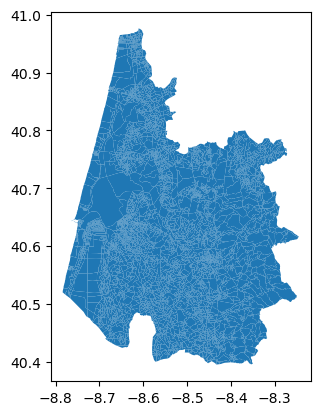

In [53]:
shape_CONT_WGS84_reg_aveiro.plot()

In [66]:
agg_columns = shape_CONT_WGS84_reg_aveiro.columns[13:45].tolist()

In [67]:
agg_dict = {col: 'sum' for col in agg_columns}

<Axes: >

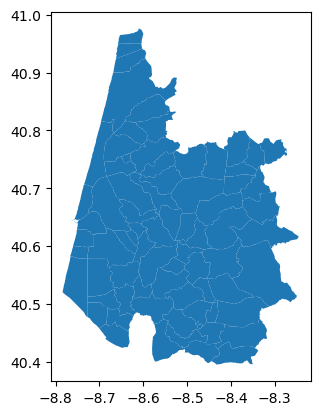

In [68]:
# Criar uma representação geométrica do municipio (polígono único)
# Permite-nos ter uma representação dos limites da área de estudo
# Atenção que mantém o mesmo referencial geográfico dos dados originais

shape_REG_Aveiro = shape_CONT_WGS84_reg_aveiro.dissolve(by='DTMNFR21', aggfunc=agg_dict)#agrega a area para as freguesias
#shape_REG_Aveiro = shape_CONT_WGS84_Aveiro.dissolve('DTMNFR21')#agrega a area para as freguesias
shape_REG_Aveiro.plot()

In [69]:
print(shape_REG_Aveiro.shape)

(74, 33)


In [750]:
# Projeção geográfica do sistema de referenciação fornecido na BGRI2021 (EPSG:3763) para o sistema de referenciação
# utilizado na biblioteca "contextily" (EPSG:3857)
# A biblioteca "contextily" permite a sobreposição de mapas base (imagens de satélite, mapas de ruas, etc) sobre
# os nossos mapas / representações geométricas das nossas unidades de análise

shape_REG_Aveiro_WGS84_reprojetct = shape_REG_Aveiro.to_crs(epsg=3857)

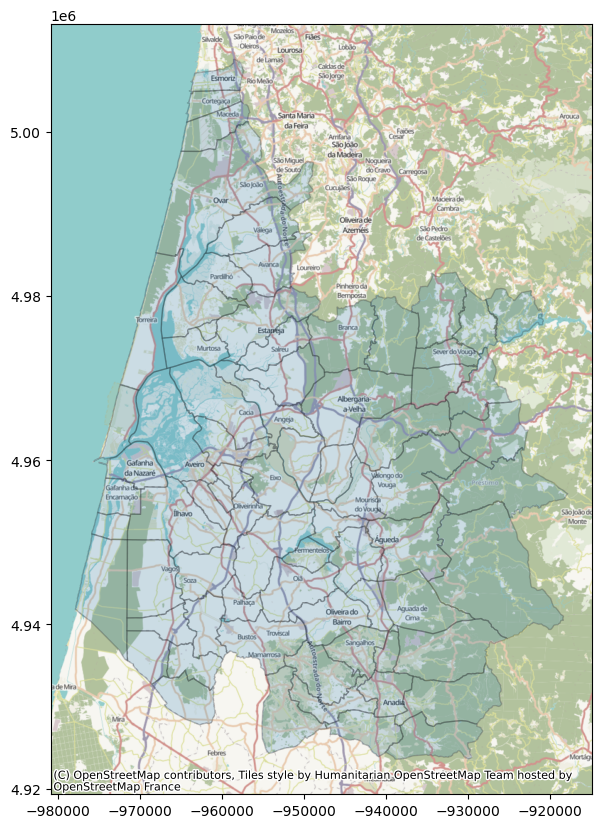

In [752]:
# Adição de um mapa de fundo ao nosso mapa de subsecções estatísticas do Porto
# Neste caso, associamos um mapa obtido no serviço OpenStreetMaps https://www.openstreetmap.org/

ax = shape_REG_Aveiro_WGS84_reprojetct.plot(figsize=(10, 10), alpha=0.2, edgecolor="k")
cx.add_basemap(ax)

In [754]:
shape_REG_Aveiro.dtypes

geometry                                                         geometry
N_EDIFICIOS_CLASSICOS                                             float64
N_EDIFICIOS_CLASS_CONST_1_OU_2_ALOJ                               float64
N_EDIFICIOS_CLASS_CONST_3_OU_MAIS_ALOJAMENTOS                     float64
N_EDIFICIOS_EXCLUSIV_RESID                                        float64
N_EDIFICIOS_1_OU_2_PISOS                                          float64
N_EDIFICIOS_3_OU_MAIS_PISOS                                       float64
N_EDIFICIOS_CONSTR_ANTES_1945                                     float64
N_EDIFICIOS_CONSTR_1946_1980                                      float64
N_EDIFICIOS_CONSTR_1981_2000                                      float64
N_EDIFICIOS_CONSTR_2001_2010                                      float64
N_EDIFICIOS_CONSTR_2011_2021                                      float64
N_EDIFICIOS_COM_NECESSIDADES_REPARACAO                            float64
N_ALOJAMENTOS_TOTAL                   

In [756]:
db_excel_ine_rendaHab_freg.dtypes

Designacao         object
GeoCod             object
ValMed_RendaMen    object
LEVEL               int64
MUNICODE           object
dtype: object

In [758]:
shape_REG_Aveiro.head(3)

,geometry,N_EDIFICIOS_CLASSICOS,N_EDIFICIOS_CLASS_CONST_1_OU_2_ALOJ,N_EDIFICIOS_CLASS_CONST_3_OU_MAIS_ALOJAMENTOS,N_EDIFICIOS_EXCLUSIV_RESID,N_EDIFICIOS_1_OU_2_PISOS,N_EDIFICIOS_3_OU_MAIS_PISOS,N_EDIFICIOS_CONSTR_ANTES_1945,N_EDIFICIOS_CONSTR_1946_1980,N_EDIFICIOS_CONSTR_1981_2000,...,N_ADP_3_OU_MAIS_PESSOAS,N_NUCLEOS_FAMILIARES,N_NUCLEOS_FAMILIARES_COM_FILHOS_TENDO_O_MAIS_NOVO_MENOS_DE_25,N_INDIVIDUOS,N_INDIVIDUOS_H,N_INDIVIDUOS_M,N_INDIVIDUOS_0_14,N_INDIVIDUOS_15_24,N_INDIVIDUOS_25_64,N_INDIVIDUOS_65_OU_MAIS
DTMNFR21,,,,,,,,,,,,,,,,,,,,,
010103,"POLYGON ((-8.43181 40.50651, -8.43223 40.50663...",1575.0,1500.0,74.0,1575.0,1422.0,153.0,140.0,595.0,513.0,...,682.0,1231.0,570.0,3893.0,1856.0,2037.0,497.0,405.0,2067.0,924.0
010109,"POLYGON ((-8.53698 40.55582, -8.53922 40.55616...",1333.0,1293.0,39.0,1332.0,1210.0,123.0,63.0,577.0,482.0,...,547.0,953.0,432.0,3028.0,1461.0,1567.0,360.0,308.0,1595.0,765.0
010112,"POLYGON ((-8.45297 40.63612, -8.45306 40.6361,...",1630.0,1616.0,13.0,1628.0,1515.0,115.0,192.0,652.0,517.0,...,532.0,1047.0,426.0,3210.0,1570.0,1640.0,395.0,284.0,1630.0,901.0


In [70]:
db_excel_ine_rendaHab_freg = db_excel_ine_rendaHab_freg.copy()
db_excel_ine_rendaHab_freg.rename(columns={"GeoCod":"DTMNFR21"}, inplace=True)
db_excel_ine_rendaHab_freg['ValMed_RendaMen'] = db_excel_ine_rendaHab_freg['ValMed_RendaMen'].astype(float)

In [71]:
shape_REG_Aveiro_rendaHab = shape_REG_Aveiro.merge(db_excel_ine_rendaHab_freg, left_on = 'DTMNFR21', right_on = 'DTMNFR21', how = 'left')


In [76]:
print(shape_REG_Aveiro_rendaHab.shape)
print(shape_REG_Aveiro.shape)
print(db_excel_ine_rendaHab_freg.shape)

(74, 38)
(74, 33)
(74, 5)


In [74]:
shape_REG_Aveiro_rendaHab.head(2)

,DTMNFR21,geometry,N_EDIFICIOS_CLASSICOS,N_EDIFICIOS_CLASS_CONST_1_OU_2_ALOJ,N_EDIFICIOS_CLASS_CONST_3_OU_MAIS_ALOJAMENTOS,N_EDIFICIOS_EXCLUSIV_RESID,N_EDIFICIOS_1_OU_2_PISOS,N_EDIFICIOS_3_OU_MAIS_PISOS,N_EDIFICIOS_CONSTR_ANTES_1945,N_EDIFICIOS_CONSTR_1946_1980,...,N_INDIVIDUOS_H,N_INDIVIDUOS_M,N_INDIVIDUOS_0_14,N_INDIVIDUOS_15_24,N_INDIVIDUOS_25_64,N_INDIVIDUOS_65_OU_MAIS,Designacao,ValMed_RendaMen,LEVEL,MNCODE
0,010103,"POLYGON ((-8.43181 40.50651, -8.43223 40.50663...",1575.0,1500.0,74.0,1575.0,1422.0,153.0,140.0,595.0,...,1856.0,2037.0,497.0,405.0,2067.0,924.0,Aguada de Cima,256.49,6,0101
1,010109,"POLYGON ((-8.53698 40.55582, -8.53922 40.55616...",1333.0,1293.0,39.0,1332.0,1210.0,123.0,63.0,577.0,...,1461.0,1567.0,360.0,308.0,1595.0,765.0,Fermentelos,277.00,6,0101


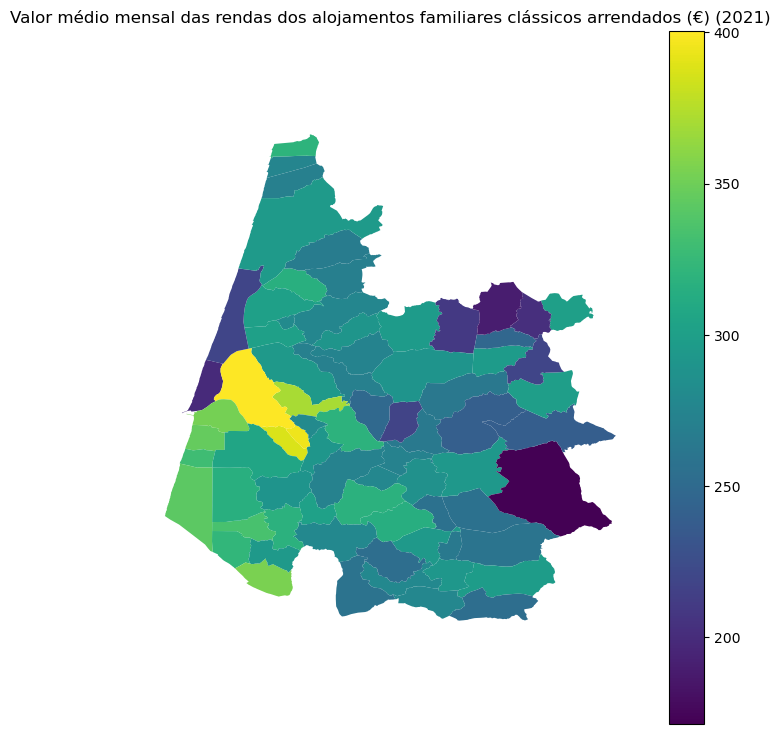

In [80]:
figura, ax = plt.subplots(1, figsize=(8, 9))
shape_REG_Aveiro_rendaHab.plot(ax=ax, column='ValMed_RendaMen', 
                               legend=True) 
ax.set_axis_off()
ax.set_title('Valor médio mensal das rendas dos alojamentos familiares clássicos arrendados (€) (2021)')
plt.axis('equal')
plt.show()

## Notas sobre classificação dos dados para visualização

A classificação de dados para visualização constitui um problema de particionar os valores dos atributos em classes mutuamente exclusivas e exaustivas. A estratégia de partição é condicional à escala de medição do atributo em questão. Para atributos quantitativos (escalas ordinais, de intervalo, de razão) as classes terão uma ordenação explícita.
Mais formalmente, o problema de classificação é definir os limites de classe tal que:
$$
c_j < y_i \le  c_{j+1} \ \forall y_i \in C_{j}
$$

- onde $y_i$ é o valor do atributo, com localização espacial  $i$ (no caso de cartogramas com limites admistrativos, este índice corresponde à unidade administrativa; no caso de cartogramas de objetos de análise, este índice corresponde especificamente à localização desse mesmo objeto; note-se que os limites administrativos podem também ser considerados os nossos objetos de análise - tudo depende da formulação do problema.
- $j$ é o índice da classe 
- e $c_j$ representa o limite inferior do intervalo $j$.

Para operacionalizar este objetivo o pacote Paysal disponibiliza a livraria Mapclassify, devendo ser acedida a [documentação oficial](https://pysal.org/mapclassify/api.html)

In [81]:
# https://pysal.org/mapclassify/api.html
# pysal.viz »» mapclassify 
import mapclassify as mc

import seaborn as sns

In [82]:
shape_REG_Aveiro_rendaHab['ValMed_RendaMen'].describe().round(1)

count     74.0
mean     285.3
std       44.7
min      171.4
25%      263.0
50%      287.9
75%      304.6
max      400.4
Name: ValMed_RendaMen, dtype: float64


A visualização dos padrões geográficos das variáveis constitui um elemento chave na análise exploratória dos dados espacias.
No entanto, a visualização requer a configuração de paletes de cor para descrever as características marcantes dos dados. Importa assim perceber a distribuição dos dados e fornecer uma palete de cores que nos descreva as propriedades mais marcantes dessa distribuição.

Importa assim conjugar a exploração gráfica da distribuição dos dados - para a qual recorremos à livraria mapclassify e seaborn - bem como a sua visualização geográfica.

In [83]:
# Intervalos iguais

classi = mc.EqualInterval(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'], k=7)
classi

EqualInterval

    Interval       Count
------------------------
[171.41, 204.12] |     4
(204.12, 236.84] |     4
(236.84, 269.55] |    15
(269.55, 302.27] |    32
(302.27, 334.98] |    11
(334.98, 367.70] |     4
(367.70, 400.41] |     4

##### Quantiles

In [84]:
classi_quant = mc.Quantiles(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'], k=6)
classi_quant

Quantiles

    Interval       Count
------------------------
[171.41, 253.36] |    13
(253.36, 271.02] |    12
(271.02, 287.92] |    12
(287.92, 296.85] |    12
(296.85, 318.41] |    12
(318.41, 400.41] |    13

In [85]:
classi_quant.bins

array([253.35666667, 271.01666667, 287.92      , 296.85      ,
       318.41      , 400.41      ])

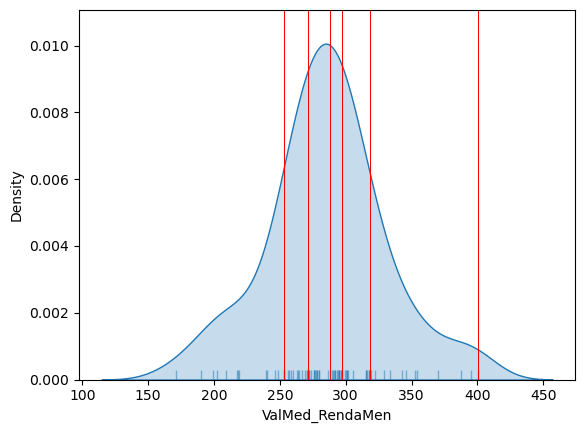

In [86]:
# Código padrão - usa a livraria seaborn (extende a matplotlib )
# https://seaborn.pydata.org/tutorial.html
# Set up the figure
f, ax = plt.subplots(1)
# Plot the kernel density estimation (KDE)
sns.kdeplot(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'], fill=True)
# Add a blue tick for every value at the bottom of the plot (rugs)
sns.rugplot(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'], alpha=0.5)
# Loop over each break point and plot a vertical red line
for cut in classi_quant.bins:
    plt.axvline(cut, color='red', linewidth=0.75)

<Axes: >

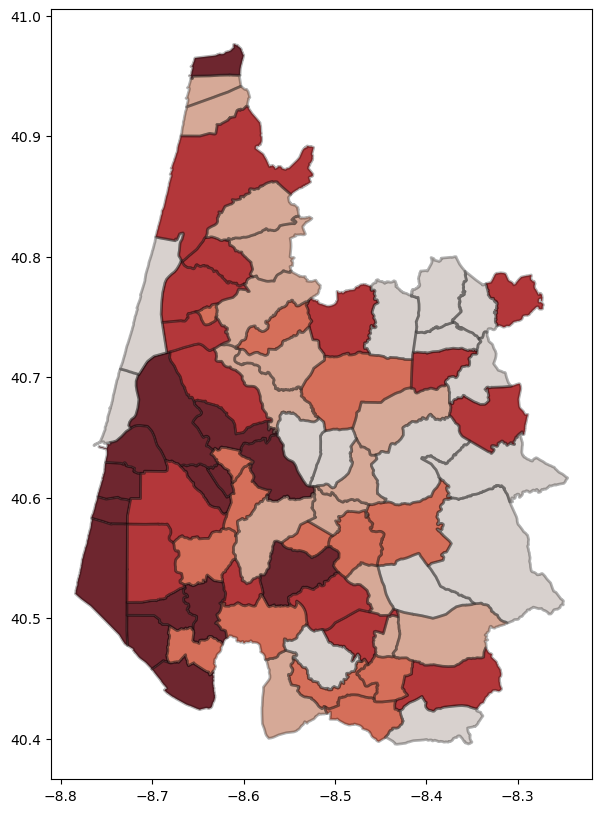

In [87]:
#NOTAs: 
# note-se que agora temos de definir os argumentos column, scheme e cmap
# o argumento «cmap» pode ser configurado seguindo esquemas predefinidos:
# https://matplotlib.org/stable/gallery/color/colormap_reference.html


#Usar a matplotlib para visualizar vários dados
figura, ax = plt.subplots(figsize = (10,10) )
ax.set_aspect('equal')
shape_REG_Aveiro_rendaHab.plot(ax=ax, zorder=2, 
                             color='grey', 
                             edgecolor='black', linewidth=2,
                            alpha = 0.3)

shape_REG_Aveiro_rendaHab.plot(ax=ax,zorder=1,
                      # marker="s",
                      column='ValMed_RendaMen', 
                      scheme='Quantiles', 
                      # k=7, 
                      cmap=plt.cm.Reds, 
                      linewidth=0 )

In [88]:
# Desvio padrão médio
classi = mc.StdMean(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'])
classi

StdMean

    Interval       Count
------------------------
[171.41, 195.96] |     2
(195.96, 240.64] |     8
(240.64, 329.99] |    55
(329.99, 374.67] |     6
(374.67, 400.41] |     3

In [89]:
# Baseado na caixa de bigodes
classi = mc.BoxPlot(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'])
classi

BoxPlot

    Interval       Count
------------------------
[171.41, 200.63] |     3
(200.63, 263.03] |    16
(263.03, 287.92] |    18
(287.92, 304.63] |    18
(304.63, 367.03] |    15
(367.03, 400.41] |     4

In [90]:
# Fisher Jenks

classi = mc.FisherJenks(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'])
classi

FisherJenks

    Interval       Count
------------------------
[171.41, 218.64] |     8
(218.64, 278.46] |    26
(278.46, 305.63] |    22
(305.63, 354.46] |    14
(354.46, 400.41] |     4

## Folium 

In [92]:
shape_REG_Aveiro_rendaHab_folium = shape_REG_Aveiro_rendaHab.to_crs(epsg=4326)

map = folium.Map(location=[shape_REG_Aveiro_rendaHab_folium.geometry.centroid.y.mean(), 
                         shape_REG_Aveiro_rendaHab_folium.geometry.centroid.x.mean()], 
                          tiles="OpenStreetMap",
                        zoom_start=13, control_scale=False)


folium.Choropleth( geo_data = shape_REG_Aveiro_rendaHab_folium,
                  data=shape_REG_Aveiro_rendaHab_folium,
                  columns= ["DTMNFR21","ValMed_RendaMen"],
                  key_on="feature.properties.DTMNFR21",
                 # key_on='y_02_EB_Rat_EleCon',
                  fill_color= 'Reds', 
                  fill_opacity= 0.60, 
                  linewidth=0.5).add_to(map)


# style_function = lambda x: {'fillColor': 'black', 'color': 'grey', 'weight': 0.5}

# folium.GeoJson(gdf_CircEUlar_targets_eda_folium, style_function=style_function).add_to(map)

map

C:\Users\wpego\AppData\Local\Temp\ipykernel_7552\3710539624.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  map = folium.Map(location=[shape_REG_Aveiro_rendaHab_folium.geometry.centroid.y.mean(),
C:\Users\wpego\AppData\Local\Temp\ipykernel_7552\3710539624.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  shape_REG_Aveiro_rendaHab_folium.geometry.centroid.x.mean()],


In [95]:
import folium
import geopandas as gpd

# Ensure CRS is set to WGS84 (EPSG:4326) for compatibility with Folium
shape_REG_Aveiro_rendaHab_folium = shape_REG_Aveiro_rendaHab.to_crs(epsg=4326)

shape_REG_Aveiro_rendaHab_folium["ValMed_RendaMen_rounded"] = shape_REG_Aveiro_rendaHab_folium["ValMed_RendaMen"].apply(lambda x: f"{x:.0f} €")
#shape_REG_Aveiro_rendaHab_folium["DivAct_PT_rounded"] = shape_REG_Aveiro_rendaHab_folium["DivAct_PT"].apply(lambda x: f"{x:.2f}")

# Compute map center based on centroids
map_center = [
    shape_REG_Aveiro_rendaHab_folium.geometry.centroid.y.mean(),
    shape_REG_Aveiro_rendaHab_folium.geometry.centroid.x.mean()
]



# Create Folium map
m = folium.Map(
    location=map_center, 
    tiles="OpenStreetMap",
    zoom_start=13, 
    control_scale=False
)

# Add Choropleth layer for visualization
folium.Choropleth(
    geo_data=shape_REG_Aveiro_rendaHab_folium,
    data=shape_REG_Aveiro_rendaHab_folium,
    columns=["DTMNFR21", "ValMed_RendaMen"],
    key_on="feature.properties.DTMNFR21",
    fill_color='Reds', 
    fill_opacity=0.6, 
    line_opacity=0.5,
    linewidth=0.5,
    legend_name="Valor Medio Renda Mensal"
).add_to(m)

# Function to create HTML popups dynamically
def create_popup(properties):
    popup_html = "<b>Feature Info:</b><br>"
    popup_html += "<br>".join([f"{key}: {value}" for key, value in properties.items()])
    return popup_html

# Define a style function for polygon boundaries
def style_function(feature):
    return {
        'color': 'black',       # Boundary line color
        'weight': 2,            # Line thickness (higher values = thicker borders)
        'fill_opacity': 0.6,     # Adjust fill transparency
        'fill_color': 'Reds'      # Optional: Override Choropleth fill color
    }
# Add GeoJson with popups
folium.GeoJson(
    shape_REG_Aveiro_rendaHab_folium,
    name="BGRI Polygons",
    style_function=style_function,  # Apply custom boundary styles
    tooltip=folium.GeoJsonTooltip(
        fields=["DTMNFR21", "ValMed_RendaMen_rounded"], 
        aliases=["BGRI Code:", "Renda Média Mensal (€):"]
    ),
    popup=folium.GeoJsonPopup(
        fields=["Designacao","DTMNFR21", "ValMed_RendaMen_rounded"], 
        aliases=["Freguesia","BGRI Code:", "Renda Média Mensal (€):"]
    )
).add_to(m)

# Save and display
m

C:\Users\wpego\AppData\Local\Temp\ipykernel_7552\3903561446.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  shape_REG_Aveiro_rendaHab_folium.geometry.centroid.y.mean(),
C:\Users\wpego\AppData\Local\Temp\ipykernel_7552\3903561446.py:13: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  shape_REG_Aveiro_rendaHab_folium.geometry.centroid.x.mean()


### Matriz de pesos


In [96]:
import scipy 

In [97]:
scipy.__version__

'1.14.1'

In [98]:
from pysal.lib import weights


# # https://pysal.org/libpysal/api.html
# from libpysal.weights.contiguity import Queen

# from libpysal.cg import voronoi_frames

In [99]:
shape_REG_Aveiro_rendaHab.head(3)

,DTMNFR21,geometry,N_EDIFICIOS_CLASSICOS,N_EDIFICIOS_CLASS_CONST_1_OU_2_ALOJ,N_EDIFICIOS_CLASS_CONST_3_OU_MAIS_ALOJAMENTOS,N_EDIFICIOS_EXCLUSIV_RESID,N_EDIFICIOS_1_OU_2_PISOS,N_EDIFICIOS_3_OU_MAIS_PISOS,N_EDIFICIOS_CONSTR_ANTES_1945,N_EDIFICIOS_CONSTR_1946_1980,...,N_INDIVIDUOS_H,N_INDIVIDUOS_M,N_INDIVIDUOS_0_14,N_INDIVIDUOS_15_24,N_INDIVIDUOS_25_64,N_INDIVIDUOS_65_OU_MAIS,Designacao,ValMed_RendaMen,LEVEL,MNCODE
0,010103,"POLYGON ((-8.43181 40.50651, -8.43223 40.50663...",1575.0,1500.0,74.0,1575.0,1422.0,153.0,140.0,595.0,...,1856.0,2037.0,497.0,405.0,2067.0,924.0,Aguada de Cima,256.49,6,0101
1,010109,"POLYGON ((-8.53698 40.55582, -8.53922 40.55616...",1333.0,1293.0,39.0,1332.0,1210.0,123.0,63.0,577.0,...,1461.0,1567.0,360.0,308.0,1595.0,765.0,Fermentelos,277.00,6,0101
2,010112,"POLYGON ((-8.45297 40.63612, -8.45306 40.6361,...",1630.0,1616.0,13.0,1628.0,1515.0,115.0,192.0,652.0,...,1570.0,1640.0,395.0,284.0,1630.0,901.0,Macinhata do Vouga,262.70,6,0101


In [101]:
# Contiguidade Queen

w_rook_shape_REG_Aveiro_rendaHab = weights.contiguity.Queen.from_dataframe(shape_REG_Aveiro_rendaHab)

C:\Users\wpego\AppData\Local\Temp\ipykernel_7552\4115330769.py:3: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w_rook_shape_REG_Aveiro_rendaHab = weights.contiguity.Queen.from_dataframe(shape_REG_Aveiro_rendaHab)


In [102]:
shape_REG_Aveiro_rendaHab['ValMed_RendaMen'].describe()

count     74.000000
mean     285.316351
std       44.678263
min      171.410000
25%      263.032500
50%      287.920000
75%      304.632500
max      400.410000
Name: ValMed_RendaMen, dtype: float64

In [103]:
shape_REG_Aveiro_rendaHab['ValMed_RendaMen'].isna().sum()

np.int64(0)

#### Não temos dados faltantes, portanto não precisa de imputação de dados

In [108]:
w_rook_shape_REG_Aveiro_rendaHab

# Associação (autocorrelação) espacial

A associação espacial emerge nos dados quando é possível observar correlações entre observações «próximas». 
Para avaliarmos se este fenómeno está presente no nosso conjunto de dados, na análise exploratória univariada, podemos calcular o "Índice de Moran - Índice Global de Associação Espacial" bem como a sua "variante" local: o "Índice Local de Associação Espacial" LISA (na sigla inglesa).
Ao observarmos fenómenos de associação espacial, tal é um indicador importante para a necessidade de considerarmos estas relações nos modelos que viermos a especificar. 

Trabalhos científicos fundacionais dos conceitos aqui trabalhados:

A History of the Concept of Spatial Autocorrelation: A Geographer's Perspective
https://doi.org/10.1111/j.1538-4632.2008.00727.x

Local Indicators of Spatial Association—LISA
https://onlinelibrary.wiley.com/doi/10.1111/j.1538-4632.1995.tb00338.x



In [110]:
# Calcular o "spatial lag" (desfasamento espacial)

precoM2_lag = weights.lag_spatial(w_rook_shape_REG_Aveiro_rendaHab, shape_REG_Aveiro_rendaHab['ValMed_RendaMen'])
shape_REG_Aveiro_rendaHab["ValMed_RendaMen_lag"] = precoM2_lag

In [111]:
# "Normalizar" (cálculo de z-scores) as variáveis (original e desfasada)
shape_REG_Aveiro_rendaHab['ValMed_RendaMen_std'] = ( shape_REG_Aveiro_rendaHab['ValMed_RendaMen'] - shape_REG_Aveiro_rendaHab['ValMed_RendaMen'].mean() )\
                    / shape_REG_Aveiro_rendaHab['ValMed_RendaMen'].std()
shape_REG_Aveiro_rendaHab['ValMed_RendaMen_lag_std'] = ( shape_REG_Aveiro_rendaHab['ValMed_RendaMen_lag'] - shape_REG_Aveiro_rendaHab['ValMed_RendaMen_lag'].mean() )\
                    / shape_REG_Aveiro_rendaHab['ValMed_RendaMen_lag'].std()

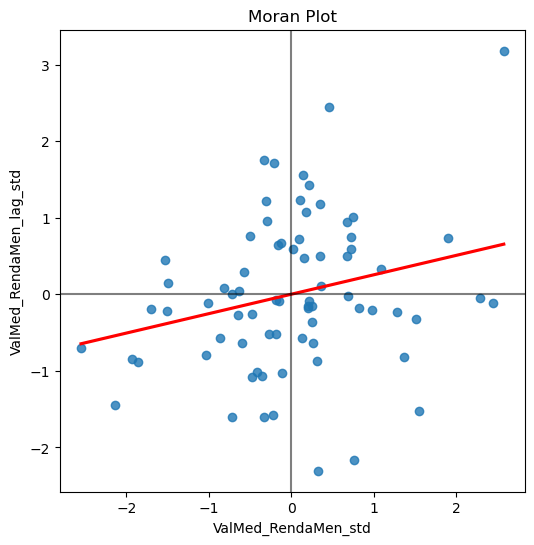

In [112]:
# Moran Plot
f, ax = plt.subplots(1, figsize=(6, 6))
sns.regplot(x='ValMed_RendaMen_std', y='ValMed_RendaMen_lag_std', 
                ci=None, data=shape_REG_Aveiro_rendaHab, line_kws={'color':'r'})
ax.axvline(0, c='k', alpha=0.5)
ax.axhline(0, c='k', alpha=0.5)
ax.set_title('Moran Plot')
plt.show()

## Associação espacial - Global

Moran’s I mede a autocorrelação espacial global e é definido por:
$$
I = \frac{N}{W}\frac{\sum_{i} \sum_{j} w_{ij} (x_i - \bar{x})(x_j - \bar{x})}{\sum_{i} (x_i - \bar{x})^2}
$$
onde:
- $( N )$ é o número total de observações no espaço
- $( W )$ é a soma de todos os pesos $( w_{ij} )$
- $( x_i )$ é o valor observado na localização $( i )$
- $( \bar{x} )$ é a média de todas as observações
- $( w_{ij} )$ é o peso espacial entre locais $( i )$ e $( j )$


**Interpretação de Moran's I:**
- $I > 0$ indica autocorrelação espacial positiva (valores similares próximos).
- $I < 0$ indica autocorrelação espacial negativa (valores dissimilares próximos).
- $I \approx 0$ indica ausência de autocorrelação espacial.



### Cálcular manualmente

1. **Calcular a média dos valores**: $ \bar{x} = \frac{1}{N} \sum_{i} x_i $
2. **Calcular os desvios da média**: $ d_i = x_i - \bar{x} $
3. **Criar matriz de pesos espaciais**: Define-se a matriz de pesos $ W $
4. **Multiplicar os desvios pelos pesos espaciais**: $ w_{ij} d_i d_j $
5. **Somar todas as interações ponderadas**
6. **Normalizar pelo total dos pesos**
7. **Interpretar Moran's I**

In [113]:
# Gerar dados espaciais sintéticos
def gerar_dados_grelha(linhas=10, colunas=10, random_state=42):
    np.random.seed(random_state)
    x, y = np.meshgrid(range(colunas), range(linhas))
    pontos = np.column_stack([x.ravel(), y.ravel()])
    valores = np.random.rand(linhas * colunas)
    return pontos, valores

# Gerar dados sintéticos
pontos, valores = gerar_dados_grelha()


In [114]:


from libpysal.weights import lat2W

# Criar matriz de pesos
w = lat2W(int(np.sqrt(len(pontos))), int(np.sqrt(len(pontos))))
matriz_pesos = np.array(w.full()[0])

In [115]:
# Função para calcular Moran's I
def morans_I(valores, matriz_pesos):
    N = len(valores)
    W = matriz_pesos.sum()
    x_barra = np.mean(valores)
    desvios = valores - x_barra
    num = sum(matriz_pesos[i, j] * desvios[i] * desvios[j] for i in range(N) for j in range(N))
    denom = sum(desvios ** 2)
    return (N / W) * (num / denom)

In [116]:
moran_val = morans_I(valores, matriz_pesos)

In [117]:
moran_val

np.float64(0.04148554197807961)

In [118]:
np.array(w_rook_shape_REG_Aveiro_rendaHab.full()[0])



array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [119]:
moran_val_cs = morans_I(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'], w_rook_shape_REG_Aveiro_rendaHab.full()[0] )

moran_val_cs

np.float64(0.3169909087292678)

#### Inferência

Estratégia de Inferência Estatística: Testes de Permutação (não paramétricos) (ver este trabalho científico para uma revisão geral):

Holt, C.A., Sullivan, S.P. (2023) Permutation tests for experimental data. Experimental Economics 26, 775–812. 
[https://doi.org/10.1007/s10683-023-09799-6](https://doi.org/10.1007/s10683-023-09799-6) 

Os testes de permutação avaliam a significância estatística dos índices espaciais ao compará-los a distribuições empíricas geradas a partir de permutações aleatórias dos dados.

**Hipóteses dos Testes de Permutação - Moran I**
- **Hipótese nula ($H_0$)**: Não há autocorrelação espacial, os valores estão distribuídos aleatoriamente.
- **Hipótese alternativa ($H_1$)**: Existe autocorrelação espacial significativa.


Procedimento do Teste de Permutação
1. **Cálculo do índice original (Moran’s I)**.
2. **Permutação dos valores mantendo a matriz de pesos fixa**.
3. **Repetição do cálculo do índice para cada permutação**.
4. **Criação da distribuição empírica**.
5. **Comparação do valor original com a distribuição empírica**.
6. **Cálculo do p-valor**: proporção das permutações em que o índice foi maior ou igual ao valor observado.





In [120]:
# Teste de permutação para Moran's I
def permutacao_morans_I(valores, matriz_pesos, num_permutacoes=999):
    I_obs = morans_I(valores, matriz_pesos)
    permutados = np.zeros(num_permutacoes)
    for i in range(num_permutacoes):
        valores_perm = np.random.permutation(valores)
        permutados[i] = morans_I(valores_perm, matriz_pesos)
    p_valor = np.mean(permutados >= I_obs)
    return I_obs, permutados, p_valor

In [121]:
I_obs, I_permutados_obs, I_permutados_pvalue = permutacao_morans_I(valores, matriz_pesos, 999)
I_obs, I_permutados_pvalue

(np.float64(0.04148554197807961), np.float64(0.23123123123123124))

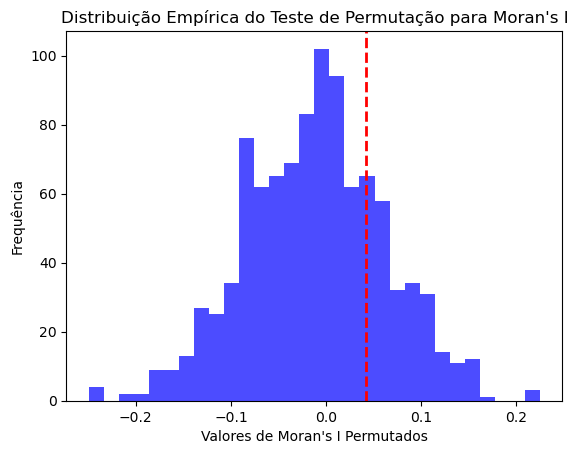

In [122]:
# Visualizar a distribuição empírica
plt.hist(I_permutados_obs, bins=30, alpha=0.7, color='blue')
plt.axvline(moran_val, color='red', linestyle='dashed', linewidth=2)
plt.title("Distribuição Empírica do Teste de Permutação para Moran's I")
plt.xlabel("Valores de Moran's I Permutados")
plt.ylabel("Frequência")
plt.show()

In [337]:
# Este código não está otimizado para grandes conjuntos de dados pelo que pode demorar algum tempo a executar

# I_permutados_cs_Iobs,I_permutados_cs, I_permutados_pvalue  = permutacao_morans_I(shape_BGRI21_Porto_CircEUlar['HousingPrice_Imputation'], w_rook_shape_BGRI21_Porto_CircEUlar.full()[0], 999)
# I_permutados_cs_Iobs,I_permutados_pvalue

### Usando a biblioteca PySAL

In [123]:
# from pysal.explore import esda
from esda.moran import Moran
from esda.moran import Moran_Local

# https://splot.readthedocs.io/en/latest/api.html
# pysal.viz »» splot [splot.esda] (tem métodos para esda e outras componentes - ver api)
from splot.esda import moran_scatterplot
from splot.esda import lisa_cluster
from splot.esda import plot_moran


In [124]:
moran_REG_Aveiro_rendaHab_WRook = Moran(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'], w_rook_shape_REG_Aveiro_rendaHab)
moran_REG_Aveiro_rendaHab_WRook.I, moran_REG_Aveiro_rendaHab_WRook.p_sim

(np.float64(0.33626064604798184), np.float64(0.001))

## Associação espacial - Local

LISA mede a autocorrelação local e é definido por:
$$
I_i = \frac{(x_i - \bar{x})}{S^2} \sum_j w_{ij} (x_j - \bar{x})
$$

onde:
- $I_i$ é o valor de Moran's I local para a observação $i$.
- $S^2$ é a variância da variável espacial.
- $w_{ij}$ é o peso espacial entre a observação $i$ e seus vizinhos $j$.


**Interpretação de Moran's I:**
- $I > 0$ indica autocorrelação espacial positiva (valores similares próximos).
- $I < 0$ indica autocorrelação espacial negativa (valores dissimilares próximos).
- $I \approx 0$ indica ausência de autocorrelação espacial.

Cada observação possui um valor LISA próprio, permitindo analisar padrões espaciais locais.


### Cálcular manualmente

1. **Calcular a média dos valores**.
2. **Determinar os desvios da média para cada observação**.
3. **Multiplicar cada desvio pelos seus vizinhos ponderados**.
4. **Guardar o valor LISA para cada observação**.
5. **Interpretar os valores LISA:**
   - **Alto-Alto (AA)**: valores elevados cercados por valores elevados.
   - **Baixo-Baixo (BB)**: valores baixos cercados por valores baixos.
   - **Alto-Baixo (AB)**: valores altos cercados por valores baixos.
   - **Baixo-Alto (BA)**: valores baixos cercados por valores altos.

In [344]:
# Função para calcular LISA
def lisa_local(valores, matriz_pesos):
    n = len(valores)
    media_valores = np.mean(valores)
    desvios = valores - media_valores
    W_soma = matriz_pesos.sum(axis=1)
    lisa_I = np.array([(n / W_soma[i]) * (desvios[i] * np.sum(matriz_pesos[i, :] * desvios)) for i in range(n)])
    return lisa_I

In [345]:
lisa_valores = lisa_local(valores, matriz_pesos)

#### Inferência

Estratégia de Inferência Estatística: Testes de Permutação (não paramétricos) (ver este trabalho científico para uma revisão geral):

Holt, C.A., Sullivan, S.P. (2023) Permutation tests for experimental data. Experimental Economics 26, 775–812. 
[https://doi.org/10.1007/s10683-023-09799-6](https://doi.org/10.1007/s10683-023-09799-6) 

Os testes de permutação avaliam a significância estatística dos índices espaciais ao compará-los a distribuições empíricas geradas a partir de permutações aleatórias dos dados.

**Hipóteses dos Testes de Permutação - LISA**
- **Hipótese nula ($H_0$)**: O valor observado na localização $i$ não tem correlação espacial com seus vizinhos.
- **Hipótese alternativa ($H_1$)**: O valor na localização $i$ está correlacionado espacialmente com os vizinhos.



Procedimento do Teste de Permutação
1. **Cálculo do índice original (LISA)**.
2. **Permutação dos valores mantendo a matriz de pesos fixa**.
3. **Repetição do cálculo do índice para cada permutação**.
4. **Criação da distribuição empírica**.
5. **Comparação do valor original com a distribuição empírica**.
6. **Cálculo do p-valor**: proporção das permutações em que o índice foi maior ou igual ao valor observado.





In [125]:
def permutacao_lisa(valores, matriz_pesos, num_permutacoes=999):
    lisa_obs = lisa_local(valores, matriz_pesos)
    N = len(valores)
    permutados = np.zeros((num_permutacoes, N))
    for p in range(num_permutacoes):
        valores_perm = np.random.permutation(valores)
        permutados[p] = lisa_local(valores_perm, matriz_pesos)
    p_valores = np.mean(np.abs(permutados) >= np.abs(lisa_obs), axis=0)
    return lisa_obs, p_valores

### Usando a biblioteca PySAL

In [126]:
# calculate Moran_Local and plot
moranLocal_REG_Aveiro_rendaHab_WRook = Moran_Local(shape_REG_Aveiro_rendaHab['ValMed_RendaMen'], w_rook_shape_REG_Aveiro_rendaHab)

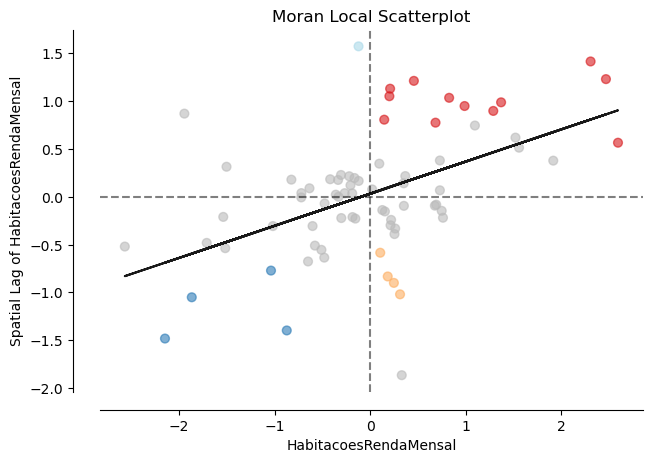

In [127]:
figura, ax = moran_scatterplot(moranLocal_REG_Aveiro_rendaHab_WRook, p=0.05)
ax.set_xlabel('HabitacoesRendaMensal')
ax.set_ylabel('Spatial Lag of HabitacoesRendaMensal')
plt.show()

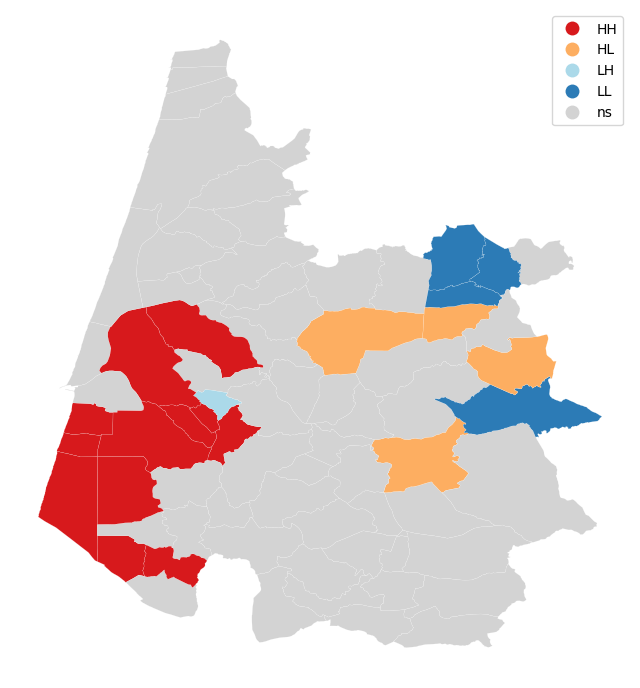

In [128]:
lisa_cluster(moranLocal_REG_Aveiro_rendaHab_WRook, shape_REG_Aveiro_rendaHab, p=0.05, figsize = (8,9))
plt.show()